## Installing Cufflinks

In [1]:
!pip install cufflinks



C:\Users\msoni0\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel\parentpoller.py:116: UserWarning: Parent poll failed.  If the frontend dies,
                the kernel may be left running.  Please let us know
                about your system (bitness, Python, etc.) at
                ipython-dev@scipy.org
  ipython-dev@scipy.org""")


  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=67932 sha256=c50535039adc46aa8de87b31ee428476b54a0ec032700780f106297ae383a78a
  Stored in directory: c:\users\msoni0\appdata\local\pip\cache\wheels\e1\27\13\3fe67fa7ea7be444b831d117220b3b586b872c9acd4df480d0
Successfully built cufflinks


## Installing chart_studio

In [3]:
!pip install chart_studio

## Import

In [5]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

## Basics

In [8]:
arr_1=np.random.randn(50,4)
df_1=pd.DataFrame(arr_1,columns=['A','B','C','D'])
df_1.head()

,A,B,C,D
0,0.104771,-0.191000,-0.370031,-0.621176
1,-0.919897,0.289970,-1.081341,-0.572245
2,1.064510,0.271502,-0.500095,-0.043923
3,0.124221,-0.932778,1.052866,-3.166689
4,0.400917,1.595895,0.199227,-0.378151


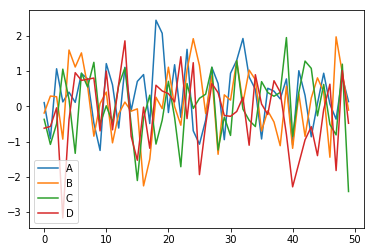

In [9]:
df_1.plot()

In [10]:
df_1.iplot()

## Line Plots

In [12]:
import plotly.graph_objects as go
df_stocks=px.data.stocks()
df_stocks.head()

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


In [13]:
px.line(df_stocks,x='date',y='GOOG',labels={'x':'Date', 'y':'Price'})

In [15]:
px.line(df_stocks, x='date', y=['GOOG','AAPL'], labels={'x':'Date', 'y':'Price'}, title='Apple vs Google')

In [19]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, mode='lines', name='Apple'))

fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, mode='lines+markers', name='Amazon'))


fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, mode='lines+markers', name='Google', line=dict(color='firebrick', width=2,dash='dashdot')))

In [20]:
fig.update_layout(title='stock price data 2018 to 2020',xaxis_title='Price', yaxis_title='Date')

In [23]:
fig.update_layout(xaxis=dict(showline=True, showgrid=False, showticklabels=True, linecolor='rgb(204,204,204)',linewidth=2, ticks='outside', tickfont=dict(family='Arial',size=12, color='rgb(82,82,82)')), 
                            yaxis=dict(showgrid=False, zeroline=False, showline=False, showticklabels=False),
                            autosize=False,
                             margin=dict(autoexpand=False, l=100, r=20, t=110 ),
                             showlegend=False, plot_bgcolor='white'
                             
                            )

## Bar Charts

In [25]:
df_us=px.data.gapminder()
df_us.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4


In [27]:
df_us=px.data.gapminder().query("country == 'India'")
px.bar(df_us, x='year',y='pop')


In [30]:
df_tips = px.data.tips()
df_tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [31]:
px.bar(df_tips,x='day',y='tip', color='sex', 
       title='Tips by sex on Each day', labels={'tip' :'Tip Amount', 'day':'Day of the week'})

In [33]:
px.bar(df_tips,x='sex',y='total_bill', color='smoker', barmode='group')

In [43]:
df_europe= px.data.gapminder().query("continent=='Europe' and year== 2007 and pop >2.e6")
#df_europe.head()
fig = px.bar(df_europe, y='pop', x='country', text='pop', color='country')
fig

In [45]:
fig.update_traces(texttemplate='%{text:.2s}',textposition='outside')
fig.update_layout(uniformtext_minsize=8)
fig.update_layout(xaxis_tickangle=-45) #45 degree rotation
fig

## Scatter Plots

In [47]:
df_iris = px.data.iris()
df_iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


In [48]:
px.scatter(df_iris, x='sepal_width', y='sepal_length', color='species', size='petal_length', 
          hover_data=['petal_width'])

In [49]:
fig =go.Figure()
fig.add_trace(go.Scatter(x=df_iris.sepal_width, y=df_iris.sepal_length, mode='markers', marker_color=df_iris.sepal_width, text=df_iris.species, 
                         marker=dict(showscale=True)))
fig.update_traces(marker_line_width=2, marker_size=10)

In [50]:
fig=go.Figure(data=go.Scattergl(x=np.random.randn(100000),
                                y=np.random.randn(100000), 
                                mode='markers', marker=dict(color=np.random.randn(100000), colorscale='Viridis', line_width=1)))
fig

## Pie Charts


In [58]:
df_asia=px.data.gapminder().query("year==2007").query("continent=='Asia'")
px.pie(df_asia, values='pop', names='country', title='Population of Asian Continent', color_discrete_sequence=px.colors.sequential.RdBu, width=700)

In [60]:
colors=['blue','green','black','red','purple','red','brown']
fig=go.Figure(data=[go.Pie(labels=['water','Grass','Normal','Psychic','Fire','Ground'], values=[110,90,80,80,70,60])])
fig

In [64]:
fig.update_traces(hoverinfo='label+percent', textfont_size=20, textinfo='label+percent', pull=[0.1, 0, 0.2, 0, 0, 0],
                marker=dict(colors=colors, line=dict(color='#FFFFFF',
                                                     width=2)))
fig

## Histogram

In [65]:
dice_1=np.random.randint(1,7,5000)
dice_2=np.random.randint(1,7,5000)
dice_sum= dice_1+dice_2
fig = px.histogram(dice_sum, nbins=11, labels={'value':'Dice Roll'}, title='5000 dic Roll histogram', marginal='violin', 
                  color_discrete_sequence=['green'])
fig

In [66]:
fig.update_layout(xaxis_title_text='Dice Roll',
                  yaxis_title_text='Dice Sum',
                 bargap=0.2, showlegend=False)
fig

In [71]:
df_tips=px.data.tips()
px.histogram(df_tips, x='total_bill', color='sex')

## BoxPlot

In [72]:
df_tips=px.data.tips()
px.box(df_tips, x='sex', y='tip', points='all')

In [73]:
px.box(df_tips, x='day', y='tip',color='sex')

In [74]:
fig=go.Figure()
fig.add_trace(go.Box(x=df_tips.sex, y=df_tips.tip, 
                     marker_color='blue', 
                    boxmean='sd')) # sd means standard deviation

In [79]:
df_stocksocksocks=px.data.stocks()
fig=go.Figure()
fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints='all', fillcolor='blue', jitter=0.5, whiskerwidth=0.2))
fig.add_trace(go.Box(y=df_stocks.AAPL,  boxpoints='all', fillcolor='red', jitter=0.5, whiskerwidth=0.2))
fig.update_layout(title='Google vs Apple', yaxis=dict(gridcolor='rgb(255, 255, 255)', gridwidth=3),
                 paper_bgcolor='rgb(243,243,243)',
                 plot_bgcolor='rgb(243, 243, 243)'
                 )

## Violin Plots

 violin plot is a combination of box plot

In [83]:
px.violin(df_tips,y=df_tips.total_bill,box=True, points='all' )

In [85]:
px.violin(df_tips, y='tip', x='smoker', color='sex', box=True, points='all'
          , hover_data=df_tips.columns)

In [87]:
fig=go.Figure()
fig.add_trace(go.Violin(x=df_tips['day'][df_tips['smoker']=='Yes'],
                       y=df_tips['total_bill'][df_tips['smoker']=='Yes'],
                       legendgroup='Yes', scalegroup='Yes', name='Yes',
                       side='negative', line_color='blue')) #left

fig.add_trace(go.Violin(x=df_tips['day'][df_tips['smoker']=='No'],
                       y=df_tips['total_bill'][df_tips['smoker']=='No'],
                       legendgroup='Yes', scalegroup='Yes', name='No',
                       side='positive', line_color='red')) #Right

## Density Heatmap

In [89]:
flights= sns.load_dataset("flights")
flights.head()

,year,month,passengers
0,1949,January,112
1,1949,February,118
2,1949,March,132
3,1949,April,129
4,1949,May,121


In [91]:
fig=px.density_heatmap(flights,x='year',y='month',z='passengers', color_continuous_scale='Viridis')
fig

In [92]:
fig=px.density_heatmap(flights,x='year',y='month',z='passengers',
                      marginal_x='histogram',
                      marginal_y='histogram')
fig

## 3D Scatter Plots

In [93]:
fig= px.scatter_3d(flights,x='year',y='month',z='passengers',color='year', opacity=0.7)
fig

## 3D line plot

In [95]:
fig= px.line_3d(flights,x='year',y='month',z='passengers',color='year')
fig

## Scatter Matrix

In [96]:
fig=px.scatter_matrix(flights, color='month')
fig